In [1]:
# Importer les libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tweepy
import pandas as pd
#from dataprep.eda import create_report
import contractions
import re
import string
from textblob import TextBlob
from nltk.tokenize import word_tokenize
import nltk

nltk.download("stopwords")
from nltk.corpus import stopwords
stop = set(stopwords.words('english'))
nltk.download('brown')
from nltk.stem import WordNetLemmatizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
from wordcloud import WordCloud
import gensim
from gensim import corpora
from gensim.models import CoherenceModel
import warnings
warnings.filterwarnings("ignore")
import pyLDAvis
import pyLDAvis.gensim #dont skip this
from gensim.utils import simple_preprocess
import time
from tweepy.auth import OAuthHandler
import jsonpickle
import csv
import time
stop_words = stopwords.words('english')
import os

import pyLDAvis.gensim_models as gensimvis
import pickle 
import pyLDAvis

from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

from sklearn.ensemble import VotingClassifier



from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Extra\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package brown to
[nltk_data]     C:\Users\Extra\AppData\Roaming\nltk_data...
[nltk_data]   Package brown is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Extra\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [2]:
# Importer le dataset
data_fake=pd.read_csv('fake_or_real_news.csv')

In [3]:
data_fake

,Unnamed: 0,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL
...,...,...,...,...
6330,4490,State Department says it can't find emails fro...,The State Department told the Republican Natio...,REAL
6331,8062,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,FAKE
6332,8622,Anti-Trump Protesters Are Tools of the Oligarc...,Anti-Trump Protesters Are Tools of the Oligar...,FAKE
6333,4021,"In Ethiopia, Obama seeks progress on peace, se...","ADDIS ABABA, Ethiopia —President Obama convene...",REAL


In [4]:
data_fake.head(5)

,Unnamed: 0,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL


In [5]:
data_fake.shape

(6335, 4)

In [6]:
data_fake.columns

Index(['Unnamed: 0', 'title', 'text', 'label'], dtype='object')

In [7]:
data_fake = data_fake.rename(columns={"Unnamed: 0": "tweet_id"})

In [8]:
data_fake

,tweet_id,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL
...,...,...,...,...
6330,4490,State Department says it can't find emails fro...,The State Department told the Republican Natio...,REAL
6331,8062,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,FAKE
6332,8622,Anti-Trump Protesters Are Tools of the Oligarc...,Anti-Trump Protesters Are Tools of the Oligar...,FAKE
6333,4021,"In Ethiopia, Obama seeks progress on peace, se...","ADDIS ABABA, Ethiopia —President Obama convene...",REAL


In [9]:
data_fake.to_csv("new_fake_or_real_news.csv", index=False)

In [10]:
data_fake=pd.read_csv('new_fake_or_real_news.csv')

In [11]:
data_fake

,tweet_id,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL
...,...,...,...,...
6330,4490,State Department says it can't find emails fro...,The State Department told the Republican Natio...,REAL
6331,8062,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,FAKE
6332,8622,Anti-Trump Protesters Are Tools of the Oligarc...,Anti-Trump Protesters Are Tools of the Oligar...,FAKE
6333,4021,"In Ethiopia, Obama seeks progress on peace, se...","ADDIS ABABA, Ethiopia —President Obama convene...",REAL


In [12]:
data_fake.shape

(6335, 4)

In [13]:
data_fake["label"].value_counts()

REAL    3171
FAKE    3164
Name: label, dtype: int64

# Twitter Api Streaming

In [14]:
def classify_tweet(tweet_text):
    real_news_keywords = ["breaking news", "latest news", "developing story"]
    fake_news_keywords = ["hoax", "fake", "conspiracy"]

    for keyword in real_news_keywords:
        if keyword in tweet_text.lower():
            return "REAL"

    for keyword in fake_news_keywords:
        if keyword in tweet_text.lower():
            return "FAKE"

    return "unknown"

In [15]:
st = time.time()

In [16]:
consumer_key = "nV211cauWjRmdu9a613t7bXON"
consumer_secret = "BhUXQCxACTexmi0Y1A7qvpLaAKrIKfnJCphlWYhjTmP33wNYkb"
access_token = "4559785366-e3uLZEyJhIxTf4Gu01s99FS1CnZ5cONLiUmyj4C"
access_token_secret =  "etuvGy3TxNjuua0NDNu1WgyfenNgauhSXtSxLRl729Qpl"
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)

C:\Users\Extra\anaconda3\lib\site-packages\tweepy\auth.py:120: DeprecationWarning: OAuthHandler is deprecated; use OAuth1UserHandler instead.
  warnings.warn(


In [17]:
tweetsPerQuery = 10 #this is the maximum provided by API
max_tweets = 5000 # just for the sake of While loop
fName = 'tweets.txt' # where i save the tweets
search_query=[ "real news OR fake news"]

In [18]:
#No sinceId and max_id ..Get whathever you have exhaustively
since_id = None
max_id = -1
tweet_count = 0
print("Downloading the tweeets for Search Query..takes some time..")

x=0
with open(fName,'w') as f:
    print("Downloading hashtag")
    while(tweet_count<max_tweets):
        try:
            if(max_id<=0):
                if(not since_id):
                    new_tweets = api.search_tweets(q=search_query,count=tweetsPerQuery,tweet_mode='extended')

                else:
                    new_tweets = api.search_tweets(q=search_query,count=tweetsPerQuery,tweet_mode='extended',since_id=since_id)
            else:
                if(not since_id):
                    new_tweets = api.search_tweets(q=search_query,count=tweetsPerQuery,tweet_mode='extended',max_id=str(max_id-1))
                else:
                    new_tweets = api.search_tweets(q=search_query,count=tweetsPerQuery,tweet_mode='extended',max_id=str(max_id-1),since_id=since_id)

            # Tweets Exhausted
            if(not new_tweets):
                print("No more tweets found!!")
                break
            # write all the new_tweets to a json file
            for tweet in new_tweets:
                f.write(jsonpickle.encode(tweet._json,unpicklable=False)+'\n')
                tweet_count+=len(new_tweets)
                print("Successfully downloaded {0} tweets".format(tweet_count))
                max_id=new_tweets[-1].id
        # in case of any error
        except tweepy.errors.TweepError as e:
                print("Some error!!:"+str(e))
                break
end = time.time()

print("A total of {0} tweets are downloaded and saved to {1}".format(tweet_count,fName))
print("Total time taken is ",end-st,"seconds.")

Successfully downloaded 10 tweets
Successfully downloaded 20 tweets
Successfully downloaded 30 tweets
Successfully downloaded 40 tweets
Successfully downloaded 50 tweets
Successfully downloaded 60 tweets
Successfully downloaded 70 tweets
Successfully downloaded 80 tweets
Successfully downloaded 90 tweets
Successfully downloaded 100 tweets
Successfully downloaded 110 tweets
Successfully downloaded 120 tweets
Successfully downloaded 130 tweets
Successfully downloaded 140 tweets
Successfully downloaded 150 tweets
Successfully downloaded 160 tweets
Successfully downloaded 170 tweets
Successfully downloaded 180 tweets
Successfully downloaded 190 tweets
Successfully downloaded 200 tweets
Successfully downloaded 210 tweets
Successfully downloaded 220 tweets
Successfully downloaded 230 tweets
Successfully downloaded 240 tweets
Successfully downloaded 250 tweets
Successfully downloaded 260 tweets
Successfully downloaded 270 tweets
Successfully downloaded 280 tweets
Successfully downloaded 290 t

Successfully downloaded 2355 tweets
Successfully downloaded 2365 tweets
Successfully downloaded 2375 tweets
Successfully downloaded 2385 tweets
Successfully downloaded 2395 tweets
Successfully downloaded 2405 tweets
Successfully downloaded 2415 tweets
Successfully downloaded 2425 tweets
Successfully downloaded 2435 tweets
Successfully downloaded 2445 tweets
Successfully downloaded 2455 tweets
Successfully downloaded 2465 tweets
Successfully downloaded 2475 tweets
Successfully downloaded 2485 tweets
Successfully downloaded 2495 tweets
Successfully downloaded 2505 tweets
Successfully downloaded 2515 tweets
Successfully downloaded 2525 tweets
Successfully downloaded 2535 tweets
Successfully downloaded 2545 tweets
Successfully downloaded 2553 tweets
Successfully downloaded 2561 tweets
Successfully downloaded 2569 tweets
Successfully downloaded 2577 tweets
Successfully downloaded 2585 tweets
Successfully downloaded 2593 tweets
Successfully downloaded 2601 tweets
Successfully downloaded 2609

Successfully downloaded 4681 tweets
Successfully downloaded 4691 tweets
Successfully downloaded 4701 tweets
Successfully downloaded 4711 tweets
Successfully downloaded 4721 tweets
Successfully downloaded 4731 tweets
Successfully downloaded 4741 tweets
Successfully downloaded 4751 tweets
Successfully downloaded 4761 tweets
Successfully downloaded 4771 tweets
Successfully downloaded 4781 tweets
Successfully downloaded 4791 tweets
Successfully downloaded 4801 tweets
Successfully downloaded 4811 tweets
Successfully downloaded 4821 tweets
Successfully downloaded 4831 tweets
Successfully downloaded 4841 tweets
Successfully downloaded 4851 tweets
Successfully downloaded 4861 tweets
Successfully downloaded 4871 tweets
Successfully downloaded 4881 tweets
Successfully downloaded 4891 tweets
Successfully downloaded 4901 tweets
Successfully downloaded 4911 tweets
Successfully downloaded 4921 tweets
Successfully downloaded 4931 tweets
Successfully downloaded 4941 tweets
Successfully downloaded 4951

In [19]:
import json
import csv

f = open('new_fake_or_real_news.csv','a',encoding='utf-8')
csvWriter = csv.writer(f)
headers=['tweet_id','title','text','label']
csvWriter.writerow(headers)

for inputFile in ['tweets.txt']:#all the text-file names you want to convert to Csv in the see folder as this code
    tweets = []
    for line in open(inputFile, 'r'):
        tweets.append(json.loads(line))

    print('HI',len(tweets))
    count_lines=0
    for tweet in tweets:
        try:
            csvWriter.writerow([tweet['id_str'],tweet['full_text'].split(":")[0],tweet['full_text'],classify_tweet(tweet['full_text'])])
            count_lines+=1
        except Exception as e:
            print(e)
    print(count_lines)

HI 513
513


# Data Understanding



In [2]:
data_fake_real=pd.read_csv('new_fake_or_real_news.csv')

In [3]:
data_fake_real

,tweet_id,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL
...,...,...,...,...
6796,1639234677578907648,Yyooooo I know I can just google it but ummm y...,Yyooooo I know I can just google it but ummm y...,FAKE
6797,1639234676568231939,RT @News18India,RT @News18India: अशायिता महाजन के 'अर्पण कैफे'...,unknown
6798,1639234610352496641,RT @DonaldJTrumpJr,RT @DonaldJTrumpJr: Biden's Approval PLUMMETS ...,unknown
6799,1639234500378107905,The Fight to Expose Corporations’ Real Impact ...,The Fight to Expose Corporations’ Real Impact ...,unknown


In [4]:
data_fake_real.shape

(6801, 4)

In [5]:
data_fake_real.describe()

,tweet_id,title,text,label
count,6801,6801,6801,6801
unique,6801,6590,6412,4
top,8476,RT @baxiabhishek,"Killing Obama administration rules, dismantlin...",FAKE
freq,1,21,58,3191


In [6]:
data_fake_real.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6801 entries, 0 to 6800
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   tweet_id  6801 non-null   object
 1   title     6801 non-null   object
 2   text      6801 non-null   object
 3   label     6801 non-null   object
dtypes: object(4)
memory usage: 212.7+ KB


In [7]:
data_fake_real.drop(columns=['tweet_id'],inplace=True)
data_fake_real.drop(columns=['title'],inplace=True)

In [8]:
data_fake_real

,text,label
0,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,It's primary day in New York and front-runners...,REAL
...,...,...
6796,Yyooooo I know I can just google it but ummm y...,FAKE
6797,RT @News18India: अशायिता महाजन के 'अर्पण कैफे'...,unknown
6798,RT @DonaldJTrumpJr: Biden's Approval PLUMMETS ...,unknown
6799,The Fight to Expose Corporations’ Real Impact ...,unknown


In [9]:
data_fake_real["label"].value_counts()

FAKE       3191
REAL       3177
unknown     432
label         1
Name: label, dtype: int64

In [10]:
data_fake_real = data_fake_real[data_fake_real['label'] != 'unknown']
data_fake_real = data_fake_real[data_fake_real['label'] != 'label']

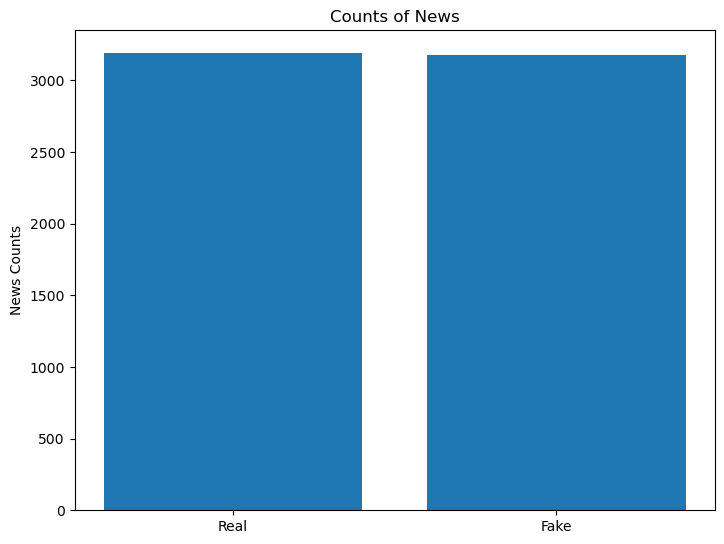

In [11]:
fig = plt.figure()
# plt.figure(figsize=(1,1))
ax = fig.add_axes([0,0,1,1])
labels = ['Real','Fake']
ax.bar(labels,data_fake_real['label'].value_counts())
plt.ylabel('News Counts')
plt.title('Counts of News')
plt.show()

In [12]:
data_fake_real.isnull().sum()

text     0
label    0
dtype: int64

In [13]:
bool_series = data_fake_real.duplicated()
#####data_agency.drop_duplicates
bool_series
print(bool_series.describe())
data_fake_real.index.is_unique

count      6368
unique        2
top       False
freq       6091
dtype: object


True

In [14]:
data_fake_real = data_fake_real.drop_duplicates()

In [15]:
data_fake_real = data_fake_real.reset_index(drop=True)

In [16]:
#create_report(data_fake_real).show()

In [17]:
data_stat = data_fake_real.copy()

In [18]:
data_stat

,text,label
0,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,It's primary day in New York and front-runners...,REAL
...,...,...
6086,Deprive them of their ability to control the S...,FAKE
6087,@elonmusk @paulg I literally get my breaking n...,REAL
6088,RT @Ru_Kyum: Bambam needs to be protected for ...,FAKE
6089,RT @MADUABU39999734: BREAKING NEWS!\r\n\r\nIke...,REAL


In [19]:
data_stat['label'] = encoder.fit_transform(data_stat['label'])

In [20]:
data_stat['num_characters'] = data_stat['text'].apply(len)

In [21]:
data_stat['num_words'] = data_stat['text'].apply(lambda x:len(nltk.word_tokenize(x)))

In [22]:
data_stat['num_sentences'] = data_stat['text'].apply(lambda x:len(nltk.sent_tokenize(x)))

<AxesSubplot:xlabel='num_characters', ylabel='Count'>

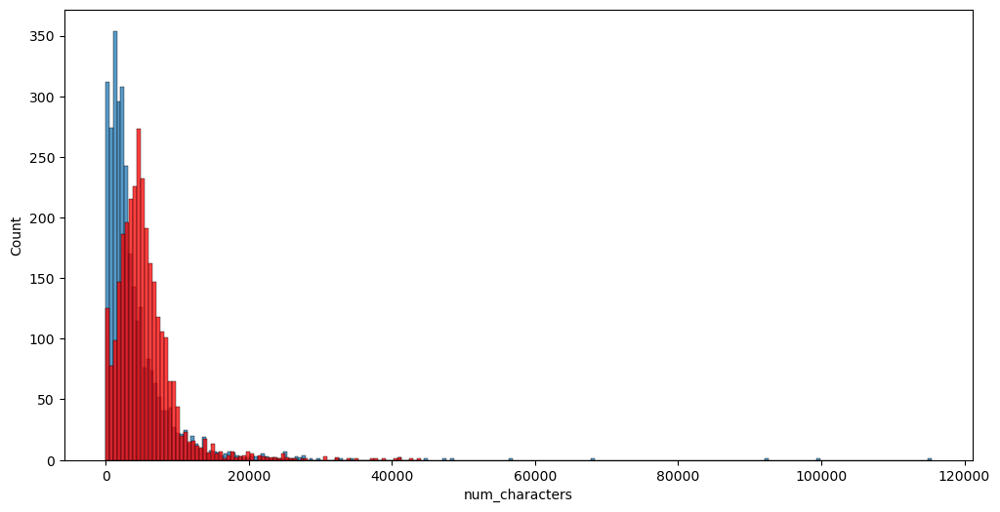

In [23]:
plt.figure(figsize=(12,6))
sns.histplot(data_stat[data_stat['label'] == 0]['num_characters'])
sns.histplot(data_stat[data_stat['label'] == 1]['num_characters'],color='red')

<AxesSubplot:xlabel='num_words', ylabel='Count'>

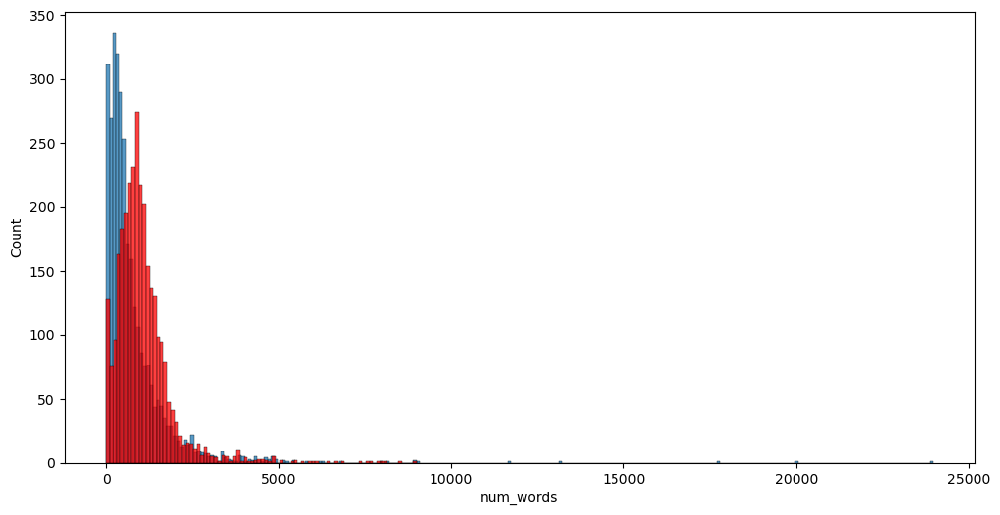

In [24]:
plt.figure(figsize=(12,6))
sns.histplot(data_stat[data_stat['label'] == 0]['num_words'])
sns.histplot(data_stat[data_stat['label'] == 1]['num_words'],color='red')

<AxesSubplot:>

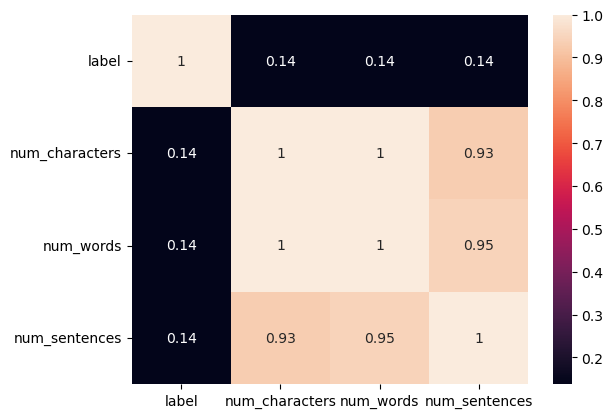

In [25]:
sns.heatmap(data_stat.corr(),annot=True)

# Data Preparation

## Text Cleaning:

In [16]:
data_fake_real["text"]

0       Daniel Greenfield, a Shillman Journalism Fello...
1       Google Pinterest Digg Linkedin Reddit Stumbleu...
2       U.S. Secretary of State John F. Kerry said Mon...
3       — Kaydee King (@KaydeeKing) November 9, 2016 T...
4       It's primary day in New York and front-runners...
                              ...                        
6086    Deprive them of their ability to control the S...
6087    @elonmusk @paulg I literally get my breaking n...
6088    RT @Ru_Kyum: Bambam needs to be protected for ...
6089    RT @MADUABU39999734: BREAKING NEWS!\r\n\r\nIke...
6090    Yyooooo I know I can just google it but ummm y...
Name: text, Length: 6091, dtype: object

In [17]:
import spacy

# Load the model with the desired language
nlp = spacy.load("en_core_web_sm")

# Define a function to detect and translate non-English text
def translate_text(text):
    # Detect the language of the text
    doc = nlp(text)
    detected_language = doc.lang_
    
    # Translate the text to English if it's not already in English
    if detected_language != "en":
        translation = doc._.translation["en"]
    else:
        translation = text
    
    return translation


In [1]:
# Apply the translate_text function to the 'text' column of the DataFrame
data_fake_real["text"] = data_fake_real["text"].apply(translate_text)

### LowerCase

In [18]:
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: x.lower())

In [19]:
data_fake_real["text"]

0       daniel greenfield, a shillman journalism fello...
1       google pinterest digg linkedin reddit stumbleu...
2       u.s. secretary of state john f. kerry said mon...
3       — kaydee king (@kaydeeking) november 9, 2016 t...
4       it's primary day in new york and front-runners...
                              ...                        
6086    deprive them of their ability to control the s...
6087    @elonmusk @paulg i literally get my breaking n...
6088    rt @ru_kyum: bambam needs to be protected for ...
6089    rt @maduabu39999734: breaking news!\r\n\r\nike...
6090    yyooooo i know i can just google it but ummm y...
Name: text, Length: 6091, dtype: object

### Expand the Contractions

In [20]:
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: contractions.fix(x))

### Remove URLs

In [21]:
def remove_URL(text):
    """
        Remove URLs from a sample string
    """
    return re.sub(r"https?://\S+|www\.\S+", "", text)

In [22]:
# remove urls from the text
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: remove_URL(x))

### Remove HTML tags

In [23]:
def remove_html(text):
    """
        Remove the html in sample text
    """
    html = re.compile(r"<.*?>|&([a-z0-9]+|#[0-9]{1,6}|#x[0-9a-f]{1,6});")
    return re.sub(html, "", text)

In [24]:
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: remove_html(x))

In [25]:
data_fake_real["text"]

0       daniel greenfield, a shillman journalism fello...
1       google pinterest digg linkedin reddit stumbleu...
2       you.s. secretary of state john f. kerry said m...
3       — kaydee king (@kaydeeking) november 9, 2016 t...
4       it is primary day in new york and front-runner...
                              ...                        
6086    deprive them of their ability to control the s...
6087    @elonmusk @paulg i literally get my breaking n...
6088    rt @ru_kyum: bambam needs to be protected for ...
6089    rt @maduabu39999734: breaking news!\r\n\r\nike...
6090    yyooooo i know i can just google it but ummm y...
Name: text, Length: 6091, dtype: object

### Remove Non-ASCI:

In [26]:
def remove_non_ascii(text):
    """
        Remove non-ASCII characters 
    """
    return re.sub(r'[^\x00-\x7f]',r'', text) # or ''.join([x for x in text if x in string.printable]) 

In [27]:
# remove non-ascii characters from the text
data_fake_real["text"]= data_fake_real["text"].apply(lambda x: remove_non_ascii(x))

### Remove special characters:

In [28]:
def remove_special_characters(text):
    """
        Remove special special characters, including symbols, emojis, and other graphic characters
    """
    emoji_pattern = re.compile(
        '['
        u'\U0001F600-\U0001F64F'  # emoticons
        u'\U0001F300-\U0001F5FF'  # symbols & pictographs
        u'\U0001F680-\U0001F6FF'  # transport & map symbols
        u'\U0001F1E0-\U0001F1FF'  # flags (iOS)
        u'\U00002702-\U000027B0'
        u'\U000024C2-\U0001F251'
        ']+',
        flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

In [29]:
data_fake_real["text"]= data_fake_real["text"].apply(lambda x: remove_special_characters(x))

In [30]:
data_fake_real["text"]

0       daniel greenfield, a shillman journalism fello...
1       google pinterest digg linkedin reddit stumbleu...
2       you.s. secretary of state john f. kerry said m...
3        kaydee king (@kaydeeking) november 9, 2016 th...
4       it is primary day in new york and front-runner...
                              ...                        
6086    deprive them of their ability to control the s...
6087    @elonmusk @paulg i literally get my breaking n...
6088    rt @ru_kyum: bambam needs to be protected for ...
6089    rt @maduabu39999734: breaking news!\r\n\r\nike...
6090    yyooooo i know i can just google it but ummm y...
Name: text, Length: 6091, dtype: object

### Remove punctuations:

In [31]:
def remove_punct(text):
    """
        Remove the punctuation
    """
#     return re.sub(r'[]!"$%&\'()*+,./:;=#@?[\\^_`{|}~-]+', "", text)
    #return text.translate(str.maketrans('', '', string.punctuation))
    exclude = set(string.punctuation) - set(",.")
    return ''.join(ch for ch in text if ch not in exclude)
    

In [32]:
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: remove_punct(x))

In [33]:
data_fake_real["text"]

0       daniel greenfield, a shillman journalism fello...
1       google pinterest digg linkedin reddit stumbleu...
2       you.s. secretary of state john f. kerry said m...
3        kaydee king kaydeeking november 9, 2016 the l...
4       it is primary day in new york and frontrunners...
                              ...                        
6086    deprive them of their ability to control the s...
6087    elonmusk paulg i literally get my breaking new...
6088    rt rukyum bambam needs to be protected for rea...
6089    rt maduabu39999734 breaking news\r\n\r\nike ek...
6090    yyooooo i know i can just google it but ummm y...
Name: text, Length: 6091, dtype: object

### Replace the Typos, slang, acronyms or informal abbreviations

In [34]:
def other_clean(text):
        """
            Other manual text cleaning techniques
        """
        # Typos, slang and other
        sample_typos_slang = {
                                "w/e": "whatever",
                                "usagov": "usa government",
                                "recentlu": "recently",
                                "ph0tos": "photos",
                                "amirite": "am i right",
                                "exp0sed": "exposed",
                                "<3": "love",
                                "luv": "love",
                                "amageddon": "armageddon",
                                "trfc": "traffic",
                                "16yr": "16 year"
                                }

        # Acronyms
        sample_acronyms =  { 
                            "mh370": "malaysia airlines flight 370",
                            "okwx": "oklahoma city weather",
                            "arwx": "arkansas weather",    
                            "gawx": "georgia weather",  
                            "scwx": "south carolina weather",  
                            "cawx": "california weather",
                            "tnwx": "tennessee weather",
                            "azwx": "arizona weather",  
                            "alwx": "alabama weather",
                            "usnwsgov": "united states national weather service",
                            "2mw": "tomorrow"
                            }

        
        # Some common abbreviations 
        sample_abbr = {
                        "$" : " dollar ",
                        "€" : " euro ",
                        "4ao" : "for adults only",
                        "a.m" : "before midday",
                        "a3" : "anytime anywhere anyplace",
                        "aamof" : "as a matter of fact",
                        "acct" : "account",
                        "adih" : "another day in hell",
                        "afaic" : "as far as i am concerned",
                        "afaict" : "as far as i can tell",
                        "afaik" : "as far as i know",
                        "afair" : "as far as i remember",
                        "afk" : "away from keyboard",
                        "app" : "application",
                        "approx" : "approximately",
                        "apps" : "applications",
                        "asap" : "as soon as possible",
                        "asl" : "age, sex, location",
                        "atk" : "at the keyboard",
                        "ave." : "avenue",
                        "aymm" : "are you my mother",
                        "ayor" : "at your own risk", 
                        "b&b" : "bed and breakfast",
                        "b+b" : "bed and breakfast",
                        "b.c" : "before christ",
                        "b2b" : "business to business",
                        "b2c" : "business to customer",
                        "b4" : "before",
                        "b4n" : "bye for now",
                        "b@u" : "back at you",
                        "bae" : "before anyone else",
                        "bak" : "back at keyboard",
                        "bbbg" : "bye bye be good",
                        "bbc" : "british broadcasting corporation",
                        "bbias" : "be back in a second",
                        "bbl" : "be back later",
                        "bbs" : "be back soon",
                        "be4" : "before",
                        "bfn" : "bye for now",
                        "blvd" : "boulevard",
                        "bout" : "about",
                        "brb" : "be right back",
                        "bros" : "brothers",
                        "brt" : "be right there",
                        "bsaaw" : "big smile and a wink",
                        "btw" : "by the way",
                        "bwl" : "bursting with laughter",
                        "c/o" : "care of",
                        "cet" : "central european time",
                        "cf" : "compare",
                        "cia" : "central intelligence agency",
                        "csl" : "can not stop laughing",
                        "cu" : "see you",
                        "cul8r" : "see you later",
                        "cv" : "curriculum vitae",
                        "cwot" : "complete waste of time",
                        "cya" : "see you",
                        "cyt" : "see you tomorrow",
                        "dae" : "does anyone else",
                        "dbmib" : "do not bother me i am busy",
                        "diy" : "do it yourself",
                        "dm" : "direct message",
                        "dwh" : "during work hours",
                        "e123" : "easy as one two three",
                        "eet" : "eastern european time",
                        "eg" : "example",
                        "embm" : "early morning business meeting",
                        "encl" : "enclosed",
                        "encl." : "enclosed",
                        "etc" : "and so on",
                        "faq" : "frequently asked questions",
                        "fawc" : "for anyone who cares",
                        "fb" : "facebook",
                        "fc" : "fingers crossed",
                        "fig" : "figure",
                        "fimh" : "forever in my heart", 
                        "ft." : "feet",
                        "ft" : "featuring",
                        "ftl" : "for the loss",
                        "ftw" : "for the win",
                        "fwiw" : "for what it is worth",
                        "fyi" : "for your information",
                        "g9" : "genius",
                        "gahoy" : "get a hold of yourself",
                        "gal" : "get a life",
                        "gcse" : "general certificate of secondary education",
                        "gfn" : "gone for now",
                        "gg" : "good game",
                        "gl" : "good luck",
                        "glhf" : "good luck have fun",
                        "gmt" : "greenwich mean time",
                        "gmta" : "great minds think alike",
                        "gn" : "good night",
                        "g.o.a.t" : "greatest of all time",
                        "goat" : "greatest of all time",
                        "goi" : "get over it",
                        "gps" : "global positioning system",
                        "gr8" : "great",
                        "gratz" : "congratulations",
                        "gyal" : "girl",
                        "h&c" : "hot and cold",
                        "hp" : "horsepower",
                        "hr" : "hour",
                        "hrh" : "his royal highness",
                        "ht" : "height",
                        "ibrb" : "i will be right back",
                        "ic" : "i see",
                        "icq" : "i seek you",
                        "icymi" : "in case you missed it",
                        "idc" : "i do not care",
                        "idgadf" : "i do not give a damn fuck",
                        "idgaf" : "i do not give a fuck",
                        "idk" : "i do not know",
                        "ie" : "that is",
                        "i.e" : "that is",
                        "ifyp" : "i feel your pain",
                        "IG" : "instagram",
                        "iirc" : "if i remember correctly",
                        "ilu" : "i love you",
                        "ily" : "i love you",
                        "imho" : "in my humble opinion",
                        "imo" : "in my opinion",
                        "imu" : "i miss you",
                        "iow" : "in other words",
                        "irl" : "in real life",
                        "j4f" : "just for fun",
                        "jic" : "just in case",
                        "jk" : "just kidding",
                        "jsyk" : "just so you know",
                        "l8r" : "later",
                        "lb" : "pound",
                        "lbs" : "pounds",
                        "ldr" : "long distance relationship",
                        "lmao" : "laugh my ass off",
                        "lmfao" : "laugh my fucking ass off",
                        "lol" : "laughing out loud",
                        "ltd" : "limited",
                        "ltns" : "long time no see",
                        "m8" : "mate",
                        "mf" : "motherfucker",
                        "mfs" : "motherfuckers",
                        "mfw" : "my face when",
                        "mofo" : "motherfucker",
                        "mph" : "miles per hour",
                        "mr" : "mister",
                        "mrw" : "my reaction when",
                        "ms" : "miss",
                        "mte" : "my thoughts exactly",
                        "nagi" : "not a good idea",
                        "nbc" : "national broadcasting company",
                        "nbd" : "not big deal",
                        "nfs" : "not for sale",
                        "ngl" : "not going to lie",
                        "nhs" : "national health service",
                        "nrn" : "no reply necessary",
                        "nsfl" : "not safe for life",
                        "nsfw" : "not safe for work",
                        "nth" : "nice to have",
                        "nvr" : "never",
                        "nyc" : "new york city",
                        "oc" : "original content",
                        "og" : "original",
                        "ohp" : "overhead projector",
                        "oic" : "oh i see",
                        "omdb" : "over my dead body",
                        "omg" : "oh my god",
                        "omw" : "on my way",
                        "p.a" : "per annum",
                        "p.m" : "after midday",
                        "pm" : "prime minister",
                        "poc" : "people of color",
                        "pov" : "point of view",
                        "pp" : "pages",
                        "ppl" : "people",
                        "prw" : "parents are watching",
                        "ps" : "postscript",
                        "pt" : "point",
                        "ptb" : "please text back",
                        "pto" : "please turn over",
                        "qpsa" : "what happens", #"que pasa",
                        "ratchet" : "rude",
                        "rbtl" : "read between the lines",
                        "rlrt" : "real life retweet", 
                        "rofl" : "rolling on the floor laughing",
                        "roflol" : "rolling on the floor laughing out loud",
                        "rotflmao" : "rolling on the floor laughing my ass off",
                        "rt" : "retweet",
                        "ruok" : "are you ok",
                        "sfw" : "safe for work",
                        "sk8" : "skate",
                        "smh" : "shake my head",
                        "sq" : "square",
                        "srsly" : "seriously", 
                        "ssdd" : "same stuff different day",
                        "tbh" : "to be honest",
                        "tbs" : "tablespooful",
                        "tbsp" : "tablespooful",
                        "tfw" : "that feeling when",
                        "thks" : "thank you",
                        "tho" : "though",
                        "thx" : "thank you",
                        "tia" : "thanks in advance",
                        "til" : "today i learned",
                        "tl;dr" : "too long i did not read",
                        "tldr" : "too long i did not read",
                        "tmb" : "tweet me back",
                        "tntl" : "trying not to laugh",
                        "ttyl" : "talk to you later",
                        "u" : "you",
                        "u2" : "you too",
                        "u4e" : "yours for ever",
                        "utc" : "coordinated universal time",
                        "w/" : "with",
                        "w/o" : "without",
                        "w8" : "wait",
                        "wassup" : "what is up",
                        "wb" : "welcome back",
                        "wtf" : "what the fuck",
                        "wtg" : "way to go",
                        "wtpa" : "where the party at",
                        "wuf" : "where are you from",
                        "wuzup" : "what is up",
                        "wywh" : "wish you were here",
                        "yd" : "yard",
                        "ygtr" : "you got that right",
                        "ynk" : "you never know",
                        "zzz" : "sleeping bored and tired"
                        }
            
        sample_typos_slang_pattern = re.compile(r'(?<!\w)(' + '|'.join(re.escape(key) for key in sample_typos_slang.keys()) + r')(?!\w)')
        sample_acronyms_pattern = re.compile(r'(?<!\w)(' + '|'.join(re.escape(key) for key in sample_acronyms.keys()) + r')(?!\w)')
        sample_abbr_pattern = re.compile(r'(?<!\w)(' + '|'.join(re.escape(key) for key in sample_abbr.keys()) + r')(?!\w)')
        
        text = sample_typos_slang_pattern.sub(lambda x: sample_typos_slang[x.group()], text)
        text = sample_acronyms_pattern.sub(lambda x: sample_acronyms[x.group()], text)
        text = sample_abbr_pattern.sub(lambda x: sample_abbr[x.group()], text)
        
        return text

In [35]:
# remove punctuations from the text
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: other_clean(x))

In [36]:
data_fake_real["text"]

0       daniel greenfield, a shillman journalism fello...
1       google pinterest digg linkedin reddit stumbleu...
2       you.s. secretary of state john f. kerry said m...
3        kaydee king kaydeeking november 9, 2016 the l...
4       it is primary day in new york and frontrunners...
                              ...                        
6086    deprive them of their ability to control the s...
6087    elonmusk paulg i literally get my breaking new...
6088    retweet rukyum bambam needs to be protected fo...
6089    retweet maduabu39999734 breaking news\r\n\r\ni...
6090    yyooooo i know i can just google it but ummm y...
Name: text, Length: 6091, dtype: object

### Spelling Correction

In [95]:
def correct_spelling(text):
    return TextBlob(text).correct()

In [1]:
data_fake_real['text'] = data_fake_real['text'].apply(lambda x: correct_spelling(x))


#### Remove \n


In [37]:
data_fake_real['text']  = data_fake_real['text'] .apply(lambda x: re.sub('\n','', x))

#### Remove Non-English characters

In [38]:
data_fake_real['text']= data_fake_real['text'].apply(lambda x: re.sub(r'[^\x00-\x7f]',r'', x))

### Exploratory Data (Text) analysis:

In [48]:
def create_word_cloud(target_df, column_name):
  print('Joining all words into long text....')
  full_text = ','.join(list(target_df[column_name].values))
  wordcloud = WordCloud(background_color="black", 
                        max_words=100,  # top 100 words in the
                        contour_width=2, 
                        contour_color='yellow')
  print('Creating word cloud')
  wordcloud.generate(full_text)
  return wordcloud

Joining all words into long text....
Creating word cloud


C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=trans

C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transpose

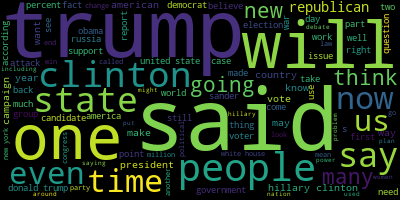

In [49]:
wordcloud = create_word_cloud(data_fake_real, 'text')
wordcloud.to_image()

C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=trans

C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transpose

C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\an

C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=trans

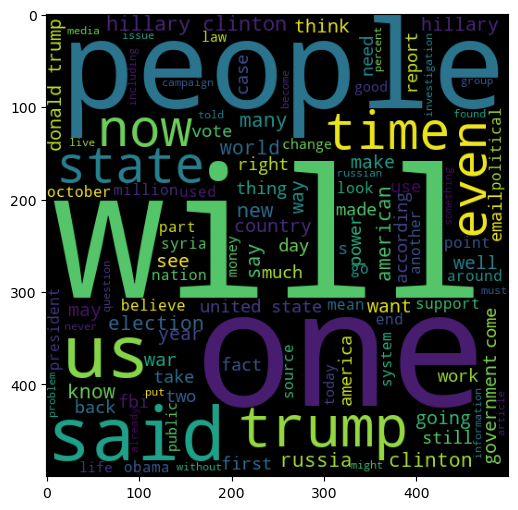

In [50]:
wc = WordCloud(width=500,height=500,min_font_size=10,background_color='black')
FAKE = wc.generate(data_fake_real[data_fake_real['label'] == 'FAKE']['text'].str.cat(sep=" "))
plt.figure(figsize=(15,6))
plt.imshow(FAKE)

C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=trans

C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transpose

C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Extra\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transpose

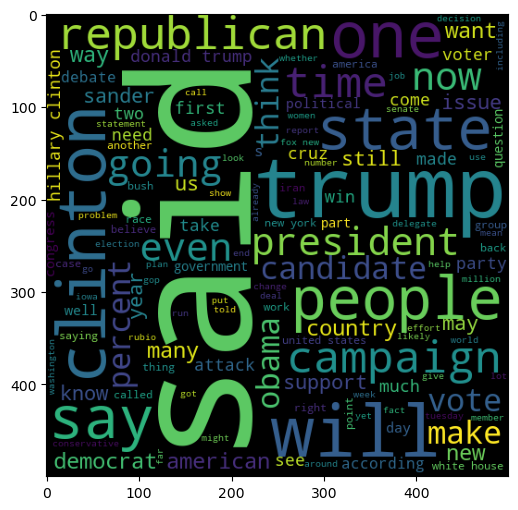

In [51]:
wc = WordCloud(width=500,height=500,min_font_size=10,background_color='black')
REAL = wc.generate(data_fake_real[data_fake_real['label'] == 'REAL']['text'].str.cat(sep=" "))
plt.figure(figsize=(15,6))
plt.imshow(REAL)

## Text Preprocessing:

### Tokenization

In [39]:
stop_words.extend(['has', 'been', 're', 'com', 'edu', 'use'])

In [40]:
# If you set deacc=True which will removes the punctuations (that we already removed)
def convert_sentences_to_words(sentences):
    for sentence in sentences:        
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

In [41]:
text_to_list = data_fake_real.text.values.tolist()

In [42]:
len(text_to_list)

6091

In [43]:
text_as_words = list(convert_sentences_to_words(text_to_list))

In [44]:
print(text_as_words[0])

['daniel', 'greenfield', 'shillman', 'journalism', 'fellow', 'at', 'the', 'freedom', 'center', 'is', 'new', 'york', 'writer', 'focusing', 'on', 'radical', 'islam', 'in', 'the', 'final', 'stretch', 'of', 'the', 'election', 'hillary', 'rodham', 'clinton', 'has', 'gone', 'to', 'war', 'with', 'the', 'fbi', 'the', 'word', 'unprecedented', 'has', 'been', 'thrown', 'around', 'so', 'often', 'this', 'election', 'that', 'it', 'ought', 'to', 'be', 'retired', 'but', 'it', 'is', 'still', 'unprecedented', 'for', 'the', 'nominee', 'of', 'major', 'political', 'party', 'to', 'go', 'war', 'with', 'the', 'fbi', 'but', 'that', 'is', 'exactly', 'what', 'hillary', 'and', 'her', 'people', 'have', 'done', 'coma', 'patients', 'just', 'waking', 'up', 'now', 'and', 'watching', 'an', 'hour', 'of', 'cnn', 'from', 'their', 'hospital', 'beds', 'would', 'assume', 'that', 'fbi', 'director', 'james', 'comey', 'is', 'hillarys', 'opponent', 'in', 'this', 'election', 'the', 'fbi', 'is', 'under', 'attack', 'by', 'everyone'

### Remove Stop Words


In [45]:
def remove_all_stop_words(texts):
    return [[word for word in simple_preprocess(str(doc)) 
             if word not in stop_words] for doc in texts]

In [47]:
clean_words = remove_all_stop_words(text_as_words)

In [48]:
print(clean_words[1])

['google', 'pinterest', 'digg', 'linkedin', 'reddit', 'stumbleupon', 'print', 'delicious', 'pocket', 'tumblr', 'two', 'fundamental', 'truths', 'world', 'paul', 'ryan', 'desperately', 'wants', 'president', 'paul', 'ryan', 'never', 'president', 'today', 'proved', 'particularly', 'staggering', 'example', 'political', 'cowardice', 'paul', 'ryan', 'rererereversed', 'course', 'announced', 'back', 'trump', 'train', 'aboutface', 'weeks', 'ago', 'previously', 'declared', 'would', 'supporting', 'defending', 'trump', 'tape', 'made', 'public', 'trump', 'bragged', 'assaulting', 'women', 'suddenly', 'ryan', 'appearing', 'protrump', 'rally', 'boldly', 'declaring', 'already', 'sent', 'vote', 'make', 'president', 'united', 'states', 'surreal', 'moment', 'figurehead', 'republican', 'party', 'dosed', 'gasoline', 'got', 'stage', 'chilly', 'afternoon', 'wisconsin', 'lit', 'match', 'speakerryan', 'says', 'voted', 'realdonaldtrump', 'republicans', 'time', 'come', 'home', 'pic', 'twitter', 'comwcvscg', 'abc',

## Bigram / Lemmatization


In [49]:
bigram = gensim.models.Phrases(clean_words, min_count=5, threshold=100) 
bigram_mod = gensim.models.phrases.Phraser(bigram)

In [50]:
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

In [51]:
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [52]:
import spacy
nlp = spacy.load('en_core_web_sm',disable=['parser', 'ner'])

In [53]:
clean_words_bigrams = make_bigrams(clean_words)

In [54]:
clean_words_bigrams[0]

['daniel_greenfield',
 'shillman',
 'journalism',
 'fellow',
 'freedom',
 'center',
 'new_york',
 'writer',
 'focusing',
 'radical_islam',
 'final_stretch',
 'election',
 'hillary_rodham',
 'clinton',
 'gone',
 'war',
 'fbi',
 'word',
 'unprecedented',
 'thrown',
 'around',
 'often',
 'election',
 'ought',
 'retired',
 'still',
 'unprecedented',
 'nominee',
 'major',
 'political',
 'party',
 'go',
 'war',
 'fbi',
 'exactly',
 'hillary',
 'people',
 'done',
 'coma',
 'patients',
 'waking',
 'watching',
 'hour',
 'cnn',
 'hospital',
 'beds',
 'would',
 'assume',
 'fbi_director',
 'james_comey',
 'hillarys',
 'opponent',
 'election',
 'fbi',
 'attack',
 'everyone',
 'obama',
 'cnn',
 'hillarys',
 'people',
 'circulated',
 'letter',
 'attacking',
 'comey',
 'currently',
 'media',
 'hit',
 'pieces',
 'lambasting',
 'targeting',
 'trump',
 'would',
 'surprising',
 'clintons',
 'allies',
 'start',
 'running',
 'attack',
 'ads',
 'fbi',
 'fbis',
 'leadership',
 'warned',
 'entire',
 'leftwing'

In [55]:
clean_words_lemmatized = lemmatization(clean_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

In [56]:
clean_words_lemmatized[0]

['shillman',
 'journalism',
 'fellow',
 'new_york',
 'writer',
 'focus',
 'final_stretch',
 'election',
 'go',
 'war',
 'word',
 'unprecedented',
 'throw',
 'around',
 'often',
 'election',
 'retire',
 'still',
 'unprecedented',
 'nominee',
 'major',
 'political',
 'party',
 'go',
 'exactly',
 'people',
 'do',
 'coma',
 'patient',
 'wake',
 'watch',
 'hour',
 'hospital',
 'bed',
 'assume',
 'fbi_director',
 'opponent',
 'attack',
 'people',
 'circulate',
 'letter',
 'attack',
 'currently',
 'medium',
 'hit',
 'piece',
 'lambaste',
 'target',
 'trump',
 'surprising',
 'clinton',
 'ally',
 'start',
 'run',
 'attack',
 'ad',
 'fbis',
 'leadership',
 'warn',
 'entire',
 'leftwe',
 'establishment',
 'form',
 'continue',
 'go',
 'attack',
 'medium',
 'preemptively',
 'head',
 'result',
 'covert',
 'struggle',
 'fbi_agent',
 'people',
 'go',
 'explosively',
 'public',
 'new_york',
 'time',
 'compare',
 'comey',
 'edgar_hoover',
 'bizarre',
 'headline',
 'role',
 'recall',
 'hoover',
 'fairly'

### Analyze Fake or Real

In [69]:
data_Mytext = pd.DataFrame({'text': clean_words_lemmatized})

In [70]:
data_Mytext['text'] = data_Mytext['text'].apply(lambda x: ' '.join(x))

In [71]:
data_fake_real['text']=data_Mytext['text']

In [77]:
#we will work on fake
fake_corpus = []
for msg in data_fake_real[data_fake_real['label'] == "FAKE"]['text'].tolist():
    for word in msg.split():
        fake_corpus.append(word)

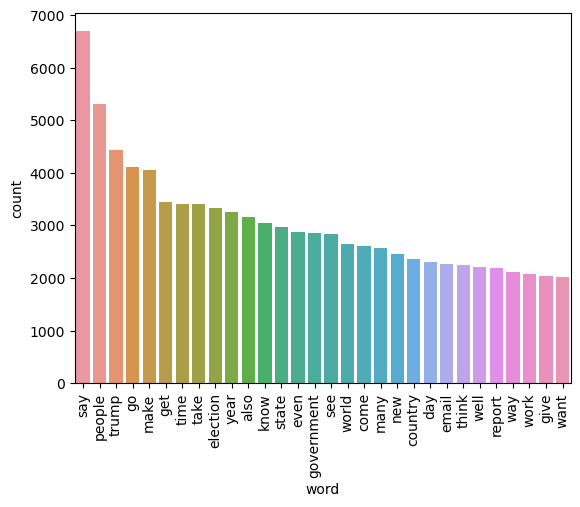

In [81]:
from collections import Counter

# count the frequency of each word in fake_corpus
word_counts = Counter(fake_corpus).most_common(30)

# create a DataFrame from word_counts
df_word_counts = pd.DataFrame(word_counts, columns=['word', 'count'])

# create a barplot using seaborn
sns.barplot(x='word', y='count', data=df_word_counts)

# rotate x-axis labels
plt.xticks(rotation='vertical')

# show the plot
plt.show()

In [82]:
#we will work on real
real_corpus = []
for msg in data_fake_real[data_fake_real['label'] == "REAL"]['text'].tolist():
    for word in msg.split():
        real_corpus.append(word)

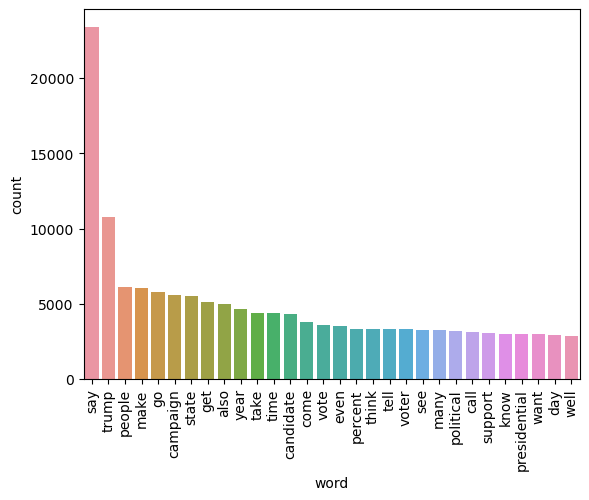

In [83]:
# count the frequency of each word in fake_corpus
word_counts = Counter(real_corpus).most_common(30)

# create a DataFrame from word_counts
df_word_counts = pd.DataFrame(word_counts, columns=['word', 'count'])

# create a barplot using seaborn
sns.barplot(x='word', y='count', data=df_word_counts)

# rotate x-axis labels
plt.xticks(rotation='vertical')

# show the plot
plt.show()

### Part of Speech Tagging (POS Tagging):

In [359]:
def pos_tagging_nltk(tokens):
    return [nltk.pos_tag(w) for w in tokens if w]

In [360]:
pos_tagging_nltk(clean_words_lemmatized)

[[('shillman', 'JJ'),
  ('journalism', 'NN'),
  ('fellow', 'JJ'),
  ('new_york', 'NN'),
  ('writer', 'NN'),
  ('focus', 'NN'),
  ('final_stretch', 'NN'),
  ('election', 'NN'),
  ('go', 'VBP'),
  ('war', 'NN'),
  ('word', 'NN'),
  ('unprecedented', 'JJ'),
  ('throw', 'NN'),
  ('around', 'RB'),
  ('often', 'RB'),
  ('election', 'NN'),
  ('retire', 'NN'),
  ('still', 'RB'),
  ('unprecedented', 'VBD'),
  ('nominee', 'JJ'),
  ('major', 'JJ'),
  ('political', 'JJ'),
  ('party', 'NN'),
  ('go', 'VBP'),
  ('exactly', 'RB'),
  ('people', 'NNS'),
  ('do', 'VBP'),
  ('coma', 'VB'),
  ('patient', 'JJ'),
  ('wake', 'NN'),
  ('watch', 'VB'),
  ('hour', 'NN'),
  ('hospital', 'NN'),
  ('bed', 'VBD'),
  ('assume', 'JJ'),
  ('fbi_director', 'NN'),
  ('opponent', 'JJ'),
  ('attack', 'NN'),
  ('people', 'NNS'),
  ('circulate', 'VBP'),
  ('letter', 'NN'),
  ('attack', 'NN'),
  ('currently', 'RB'),
  ('medium', 'RBS'),
  ('hit', 'VBN'),
  ('piece', 'JJ'),
  ('lambaste', 'NN'),
  ('target', 'NN'),
  ('trump'

## Tokenizing

In [57]:
text_to_Sentence = data_fake_real['text'].apply(lambda x:nltk.sent_tokenize(x))

In [58]:
text_to_Sentence[0]

['daniel greenfield, a shillman journalism fellow at the freedom center, is a new york writer focusing on radical islam.',
 'in the final stretch of the election, hillary rodham clinton has gone to war with the fbi.',
 'the word unprecedented has been thrown around so often this election that it ought to be retired.',
 'but it is still unprecedented for the nominee of a major political party to go war with the fbi.',
 'but that is exactly what hillary and her people have done.',
 'coma patients just waking up now and watching an hour of cnn from their hospital beds would assume that fbi director james comey is hillarys opponent in this election.',
 'the fbi is under attack by everyone from obama to cnn.',
 'hillarys people have circulated a letter attacking comey.',
 'there are currently more media hit pieces lambasting him than targeting trump.',
 'it would not be too surprising if the clintons or their allies were to start running attack ads against the fbi.',
 'the fbis leadership i

In [59]:
id2word = corpora.Dictionary(text_to_Sentence)

In [60]:
texts = text_to_Sentence

In [61]:
corpus = [id2word.doc2bow(text) for text in texts]

In [62]:
print(corpus[0])

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 1), (59, 1), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 1), (69, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 1), (76, 1), (77, 1), (78, 1), (79, 1), (80, 1), (81, 1), (82, 1), (83, 1)]


## Topic Model

In [63]:
num_topics = 10

In [64]:
# Using Gensin to build the LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus, 
                                       id2word=id2word, 
                                       num_topics=num_topics,
                                       )

In [65]:
# Print the Keyword in the N (=num_topics) topics
from pprint import pprint
pprint(lda_model.print_topics())
#pprint(lda_model.print_topics(N))

[(0,
  '0.000*"mister." + 0.000*"share" + 0.000*"you.s." + 0.000*"the you.s." + '
  '0.000*"connect" + 0.000*"here is a selection of their comments." + '
  '0.000*"tags" + 0.000*"thank you." + 0.000*"et." + 0.000*"a variety of '
  'celebrities and other public figures across a variety of faiths  and none  '
  'have expressed their support for pope francis."'),
 (1,
  '0.001*"mister." + 0.000*"the you.s." + 0.000*"you.s." + 0.000*"miss." + '
  '0.000*"share this story watch video from the onion sign up for the onions '
  'newsletter give your spam filter something to do." + 0.000*"daily '
  'headlines" + 0.000*"sources" + 0.000*"please like and share this story on '
  'facebook or twitter." + 0.000*"follow todd on twittertoddstarnes and find '
  'him on facebook." + 0.000*"his latest book is god less america real stories '
  'from the front lines of the attack on traditional values."'),
 (2,
  '0.001*"mister." + 0.000*"the you.s." + 0.000*"you.s." + 0.000*"real news '
  'and perspective

In [66]:
for i, topic in lda_model.show_topics(num_topics=10, num_words=10, formatted=False):
    print("Topic {}: {}".format(i, " ".join([word for word, _ in topic])))

Topic 0: mister. share you.s. the you.s. connect here is a selection of their comments. tags thank you. et. a variety of celebrities and other public figures across a variety of faiths  and none  have expressed their support for pope francis.
Topic 1: mister. the you.s. you.s. miss. share this story watch video from the onion sign up for the onions newsletter give your spam filter something to do. daily headlines sources please like and share this story on facebook or twitter. follow todd on twittertoddstarnes and find him on facebook. his latest book is god less america real stories from the front lines of the attack on traditional values.
Topic 2: mister. the you.s. you.s. real news and perspectives that you will not find in the mainstream media. behind the headlines  conspiracies, coverups, ancient mysteries and more. loading ... share . gov. all rights reserved.
Topic 3: brain force  25 off 34.95 22.46 flip the switch and supercharge your state of mind with brain force the next gen

In [67]:
doc_lda = lda_model[corpus]

In [68]:
doc_lda

# Analyzing the LDA Model

In [69]:
# Visualize the topics
pyLDAvis.enable_notebook()

In [70]:
LDAvis_data_filepath = os.path.join('ldavis_prepared_'+str(num_topics))

In [71]:
# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)

In [72]:
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)

In [73]:
pyLDAvis.save_html(LDAvis_prepared, 'ldavis_prepared_'+ str(num_topics) +'.html')

In [74]:
LDAvis_prepared 

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4     -0.066673  0.037952       1        1  10.805016
9     -0.027103 -0.039157       2        1  10.617648
5     -0.000200 -0.066466       3        1  10.478403
7      0.055091  0.009161       4        1  10.153112
3     -0.006226  0.015551       5        1  10.042602
8      0.023339  0.019432       6        1   9.812321
6     -0.057700  0.008663       7        1   9.677951
1     -0.000131  0.023172       8        1   9.670331
2      0.027352 -0.061508       9        1   9.618080
0      0.052250  0.053200      10        1   9.124537, topic_info=                                                   Term       Freq      Total  \
3477                                                et.  42.000000  42.000000   
5106  brain force  25 off 34.95 22.46 flip the switc...  18.000000  18.000000   
3474                                and 5 after midday.  14.000000  14.000000   
3476   click here for more information on howard kurtz.  14.000000  14.000000   
3479  he is the author of five books and is based in...  14.000000  14.000000   
...                                                 ...        ...        ...   
7105                                        loading ...   1.697873  15.152365   
3644                    billy okeefe, mcclatchy tribune   1.466551   8.072421   
3656  if survivor was actually real and had stakes w...   1.453563   8.085970   
3477                                                et.   1.963818  42.188641   
775                                                 ...   1.447004  15.106091   

     Category  logprob  loglift  
3477  Default  30.0000  30.0000  
5106  Default  29.0000  29.0000  
3474  Default  28.0000  28.0000  
3476  Default  27.0000  27.0000  
3479  Default  26.0000  26.0000  
...       ...      ...      ...  
7105  Topic10  -9.0594   0.2054  
3644  Topic10  -9.2058   0.6887  
3656  Topic10  -9.2147   0.6781  
3477  Topic10  -8.9139  -0.6731  
775   Topic10  -9.2193   0.0486  

[633 rows x 6 columns], token_table=       Topic      Freq                                               Term
term                                                                     
7830       1  0.124499                                                  .
7830       3  0.124499                                                  .
7830       5  0.124499                                                  .
7830       7  0.124499                                                  .
7830       8  0.248998                                                  .
...      ...       ...                                                ...
42959      2  0.242947  your information will never be shared with any...
42959      4  0.242947  your information will never be shared with any...
42959      5  0.485893  your information will never be shared with any...
42959      8  0.242947  your information will never be shared with any...
47426      6  0.490571  zika is dangerous because they told you so, in...

[1050 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 10, 6, 8, 4, 9, 7, 2, 3, 1])

# Model Building

In [94]:
#data_Modeling = pd.DataFrame({'text': clean_words_lemmatized})

In [95]:
#data_Modeling['text'] = data_Modeling['text'].apply(lambda x: ' '.join(x))

In [96]:
#data_fake_real['text']=data_Modeling['text']

In [128]:
data_fake_real['text']

0       Daniel Greenfield, a Shillman Journalism Fello...
1       Google Pinterest Digg Linkedin Reddit Stumbleu...
2       U.S. Secretary of State John F. Kerry said Mon...
3       — Kaydee King (@KaydeeKing) November 9, 2016 T...
4       It's primary day in New York and front-runners...
                              ...                        
6086    Deprive them of their ability to control the S...
6087    @elonmusk @paulg I literally get my breaking n...
6088    RT @Ru_Kyum: Bambam needs to be protected for ...
6089    RT @MADUABU39999734: BREAKING NEWS!\r\n\r\nIke...
6090    Yyooooo I know I can just google it but ummm y...
Name: text, Length: 6091, dtype: object

In [16]:
data_fake_real.columns

Index(['text', 'label'], dtype='object')

In [17]:
from nltk.stem.porter import PorterStemmer
ps = PorterStemmer()

In [18]:
def transform_text(text):
    text = text.lower()
    text = nltk.word_tokenize(text)
    
    y = []
    for i in text:
        if i.isalnum():
            y.append(i)
    
    text = y[:]
    y.clear()
    
    for i in text:
        if i not in stopwords.words('english') and i not in string.punctuation:
            y.append(i)
            
    text = y[:]
    y.clear()
    
    for i in text:
        y.append(ps.stem(i))
    
            
    return " ".join(y)

In [19]:
data_fake_real['text']

0       Daniel Greenfield, a Shillman Journalism Fello...
1       Google Pinterest Digg Linkedin Reddit Stumbleu...
2       U.S. Secretary of State John F. Kerry said Mon...
3       — Kaydee King (@KaydeeKing) November 9, 2016 T...
4       It's primary day in New York and front-runners...
                              ...                        
6086    Deprive them of their ability to control the S...
6087    @elonmusk @paulg I literally get my breaking n...
6088    RT @Ru_Kyum: Bambam needs to be protected for ...
6089    RT @MADUABU39999734: BREAKING NEWS!\r\n\r\nIke...
6090    Yyooooo I know I can just google it but ummm y...
Name: text, Length: 6091, dtype: object

In [20]:
data_fake_real['text'] = data_fake_real['text'].apply(transform_text)

In [21]:
data_fake_real['text']

0       daniel greenfield shillman journal fellow free...
1       googl pinterest digg linkedin reddit stumbleup...
2       secretari state john kerri said monday stop pa...
3       kayde king kaydeek novemb 9 2016 lesson tonigh...
4       primari day new york hillari clinton donald tr...
                              ...                        
6086    depriv abil control sm see real come sinc emer...
6087    elonmusk paulg liter get break news twitter pe...
6088    rt bambam need protect real everytim peopl mak...
6089    rt maduabu39999734 break news ike ekweremadu w...
6090    yyooooo know googl ummm yea spenc crawford fig...
Name: text, Length: 6091, dtype: object

In [38]:
data_fake_real

,text,label
0,daniel greenfield shillman journal fellow free...,0
1,googl pinterest digg linkedin reddit stumbleup...,0
2,secretari state john kerri said monday stop pa...,1
3,kayde king kaydeek novemb 9 2016 lesson tonigh...,0
4,primari day new york hillari clinton donald tr...,1
...,...,...
6086,depriv abil control sm see real come sinc emer...,0
6087,elonmusk paulg liter get break news twitter pe...,1
6088,rt bambam need protect real everytim peopl mak...,0
6089,rt maduabu39999734 break news ike ekweremadu w...,1


In [22]:
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
cv = CountVectorizer()
tfidf = TfidfVectorizer(max_features=10000)

In [23]:
X = tfidf.fit_transform(data_fake_real['text']).toarray()

In [24]:
X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [25]:
data_fake_real['label'] = encoder.fit_transform(data_fake_real['label'])

In [26]:
y = data_fake_real['label'].values

In [27]:
y

array([0, 0, 1, ..., 0, 1, 0])

In [28]:
from sklearn.model_selection import train_test_split

In [29]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (4872, 10000) (4872,)
Test set: (1219, 10000) (1219,)


In [30]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.naive_bayes import GaussianNB,MultinomialNB,BernoulliNB
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score
from sklearn.metrics import (confusion_matrix, precision_recall_curve, auc, roc_curve, recall_score, 
                             classification_report, f1_score, accuracy_score, average_precision_score, precision_recall_fscore_support)

In [31]:
svc = SVC(kernel='sigmoid',C=10, gamma=0.1)
knc = KNeighborsClassifier()
mnb = MultinomialNB(alpha=0.1)
dtc = DecisionTreeClassifier(max_depth=5)
lrc = LogisticRegression(C=10, penalty='l2', solver='liblinear')
rfc = RandomForestClassifier(n_estimators=50, random_state=2)
abc = AdaBoostClassifier(n_estimators=50, random_state=2)
bc = BaggingClassifier(n_estimators=50, random_state=2)
etc = ExtraTreesClassifier(n_estimators=50, random_state=2)
gbdt = GradientBoostingClassifier(n_estimators=50,random_state=2)
xgb = XGBClassifier(n_estimators=50,random_state=2)

In [32]:
clfs = {
    'SVC' : svc,
    'KN' : knc, 
    'NB': mnb, 
    'DT': dtc, 
    'LR': lrc, 
    'RF': rfc, 
    'AdaBoost': abc, 
    'BgC': bc, 
    'ETC': etc,
    'GBDT':gbdt,
    'xgb':xgb
}

In [33]:
def train_classifier(clf,X_train,y_train,X_test,y_test):
    clf.fit(X_train,y_train)
    y_pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test,y_pred)
    precision = precision_score(y_test,y_pred)
    
    return accuracy,precision

In [34]:
accuracy_scores = []
precision_scores = []

for name,clf in clfs.items():
    
    current_accuracy,current_precision = train_classifier(clf, X_train,y_train,X_test,y_test)
    
    print("For ",name)
    print("Accuracy - ",current_accuracy)
    print("Precision - ",current_precision)
    
    accuracy_scores.append(current_accuracy)
    precision_scores.append(current_precision)

For  SVC
Accuracy -  0.9269893355209188
Precision -  0.9431034482758621
For  KN
Accuracy -  0.8589007383100903
Precision -  0.9013035381750466
For  NB
Accuracy -  0.8810500410172273
Precision -  0.8868243243243243
For  DT
Accuracy -  0.7924528301886793
Precision -  0.8006872852233677
For  LR
Accuracy -  0.9220672682526662
Precision -  0.936426116838488
For  RF
Accuracy -  0.8843314191960624
Precision -  0.8955479452054794
For  AdaBoost
Accuracy -  0.8630024610336341
Precision -  0.8682432432432432
For  BgC
Accuracy -  0.874487284659557
Precision -  0.8826530612244898
For  ETC
Accuracy -  0.8785890073831009
Precision -  0.8849407783417935
For  GBDT
Accuracy -  0.8662838392124692
Precision -  0.8942652329749103
For  xgb
Accuracy -  0.8974569319114027
Precision -  0.9050847457627119


In [35]:
performance_df = pd.DataFrame({'Algorithm':clfs.keys(),'Accuracy':accuracy_scores,'Precision':precision_scores}).sort_values('Accuracy',ascending=False)

In [36]:
performance_df

,Algorithm,Accuracy,Precision
0,SVC,0.926989,0.943103
4,LR,0.922067,0.936426
10,xgb,0.897457,0.905085
5,RF,0.884331,0.895548
2,NB,0.881050,0.886824
8,ETC,0.878589,0.884941
7,BgC,0.874487,0.882653
9,GBDT,0.866284,0.894265
6,AdaBoost,0.863002,0.868243
1,KN,0.858901,0.901304


## GridSearch SVC

In [52]:
svm_model = SVC()
param_grid = {'C': [0.1, 1, 10], 'gamma': [0.1, 1, 10], 'kernel': ['sigmoid']}

# Use grid search with cross-validation to find the best hyperparameters
grid_search = GridSearchCV(svm_model, param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and test accuracy
print("Best hyperparameters: ", grid_search.best_params_)
print("Test accuracy: ", grid_search.score(X_test, y_test))

Best hyperparameters:  {'C': 10, 'gamma': 0.1, 'kernel': 'sigmoid'}
Test accuracy:  0.9269893355209188


In [53]:
svc = SVC(kernel='sigmoid',C=10, gamma=0.1)

In [54]:
svc.fit(X_train,y_train)
y_pred = svc.predict(X_test)
accuracy = accuracy_score(y_test,y_pred)
precision = precision_score(y_test,y_pred)
print("Best accuracy:", accuracy)
print("Best precision:", precision)


Best accuracy: 0.9269893355209188
Best precision: 0.9431034482758621


## GridSearch LR

In [55]:
# Define the logistic regression model
lrc = LogisticRegression()

# Define the hyperparameters to tune
param_grid = {
    'penalty': ['l1', 'l2'],
    'C': [0.1, 1, 10],
    'solver': ['liblinear', 'saga']
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(lrc, param_grid, cv=5, verbose=1)
grid_search.fit(X_train, y_train)

# Evaluate the best model on the test set
y_pred = grid_search.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Best hyperparameters: ", grid_search.best_params_)
print('Test accuracy: {:.2f}%'.format(accuracy*100))

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Test accuracy: 92.21%


In [59]:
lrc = LogisticRegression(C=10, penalty='l2', solver='liblinear')

In [60]:
lrc.fit(X_train,y_train)
y_pred = lrc.predict(X_test)
accuracy = accuracy_score(y_test,y_pred)
precision = precision_score(y_test,y_pred)
print("Best accuracy:", accuracy)
print("Best precision:", precision)

Best accuracy: 0.9220672682526662
Best precision: 0.936426116838488


## GridSearch MNB

In [64]:
mnb = MultinomialNB()

# define a grid of alpha values to test
param_grid = {'alpha': [0.1, 0.5, 1.0, 2.0, 5.0, 10.0]}

# perform a grid search to find the best alpha value
grid = GridSearchCV(mnb, param_grid, cv=5)
grid.fit(X_train, y_train)

print("Best hyperparameters: ", grid.best_params_)
print("Best cross-validation score: ", grid.best_score_)


Best hyperparameters:  {'alpha': 0.1}
Best cross-validation score:  0.8926524509029644


In [72]:
mnb = MultinomialNB(alpha=0.1)

In [73]:
mnb.fit(X_train,y_train)
y_pred = mnb.predict(X_test)
accuracy = accuracy_score(y_test,y_pred)
precision = precision_score(y_test,y_pred)
print("Best accuracy:", accuracy)
print("Best precision:", precision)

Best accuracy: 0.8810500410172273
Best precision: 0.8868243243243243


## GridSearch XGB

In [ ]:
xgb = XGBClassifier()

# Define hyperparameters and their ranges to search
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1],
    'max_depth': [3, 5, 7],
    'gamma': [0, 0.1, 0.2],
    'subsample': [0.5, 0.8, 1],
    'colsample_bytree': [0.5, 0.8, 1],
}

# Perform grid search with 5-fold cross-validation
grid_search = GridSearchCV(xgb, param_grid, cv=5)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and their score
print("Best hyperparameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)

## VotingClassifier

In [157]:
svc = SVC(kernel='sigmoid',C=10, gamma=0.1,probability=True)

In [158]:
voting = VotingClassifier(estimators=[('Xgb', xgb), ('Svc', svc), ('LR', lrc)],voting='soft')

In [159]:
voting.fit(X_train,y_train)

VotingClassifier(estimators=[('Xgb',
                              XGBClassifier(base_score=0.5, booster='gbtree',
                                            callbacks=None, colsample_bylevel=1,
                                            colsample_bynode=1,
                                            colsample_bytree=1,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=0,
                                            gpu_id=-1, grow_policy='depthwise',
                                            importance_type=None,
                                            interaction_constraints='',
                                            learning_rate=0.3...
                                            max_bin=256, max_cat_threshold=64,
                                     

In [160]:
y_pred = voting.predict(X_test)
print("Accuracy",accuracy_score(y_test,y_pred))
print("Precision",precision_score(y_test,y_pred))

Accuracy 0.9294503691550451
Precision 0.934453781512605


# SVC

In [167]:
train_score= svc.score(X_train,y_train)
test_score = svc.score(X_test,y_test)

print('train score=', train_score )
print('test score=', test_score)

train score= 0.9813218390804598
test score= 0.9269893355209188


In [161]:
svc.fit(X_train, y_train)

# prediction
preds = svc.predict(X_test)
print(classification_report(y_test, preds))

acc = accuracy_score(y_test, preds)
results_all = precision_recall_fscore_support(y_test, preds, average='macro', zero_division=1)
results_class = precision_recall_fscore_support(y_test, preds, average=None, zero_division=1)
metric_columns = ['Precision','Recall', 'F1-Score','S']
all_df = pd.concat([pd.DataFrame(list(results_class)).T,pd.DataFrame(list(results_all)).T])
all_df.columns = metric_columns

print('----------------- Overall Results -----------------')
print('Accuracy Result: %.2f%%'%(acc*100))                   # Accuracy of the whole Dataset
print('Precision Result: %.2f%%'%(all_df.iloc[2,0]*100))     # Precision of the whole Dataset
print('Recall Result: %.2f%%'%(all_df.iloc[2,1]*100))        # Recall of the whole Dataset
print('F1-Score Result: %.2f%%'%(all_df.iloc[2,2]*100)) 

              precision    recall  f1-score   support

           0       0.91      0.95      0.93       616
           1       0.94      0.91      0.92       603

    accuracy                           0.93      1219
   macro avg       0.93      0.93      0.93      1219
weighted avg       0.93      0.93      0.93      1219

----------------- Overall Results -----------------
Accuracy Result: 92.70%
Precision Result: 92.77%
Recall Result: 92.68%
F1-Score Result: 92.69%


### Confusion matrix visualization

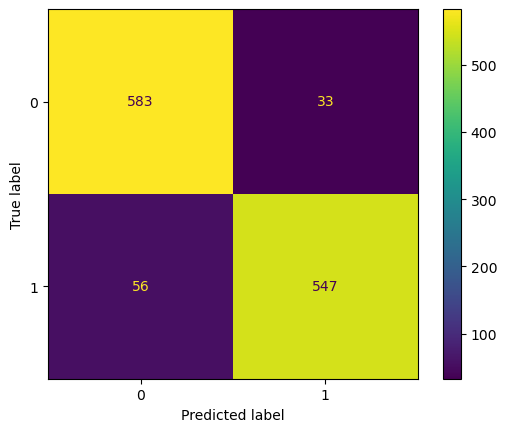

In [164]:
#  Confusion Matrix
cm1 = confusion_matrix(y_test, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm1,display_labels=svc.classes_)
disp.plot()
plt.show()

# Logistic Regression

In [168]:
train_score= lrc.score(X_train,y_train)
test_score = lrc.score(X_test,y_test)

print('train score=', train_score )
print('test score=', test_score)

train score= 0.9954844006568144
test score= 0.9220672682526662


In [165]:
lrc.fit(X_train, y_train)

# prediction
preds = lrc.predict(X_test)
print(classification_report(y_test, preds))

acc = accuracy_score(y_test, preds)
results_all = precision_recall_fscore_support(y_test, preds, average='macro', zero_division=1)
results_class = precision_recall_fscore_support(y_test, preds, average=None, zero_division=1)
metric_columns = ['Precision','Recall', 'F1-Score','S']
all_df = pd.concat([pd.DataFrame(list(results_class)).T,pd.DataFrame(list(results_all)).T])
all_df.columns = metric_columns

print('----------------- Overall Results -----------------')
print('Accuracy Result: %.2f%%'%(acc*100))                   # Accuracy of the whole Dataset
print('Precision Result: %.2f%%'%(all_df.iloc[2,0]*100))     # Precision of the whole Dataset
print('Recall Result: %.2f%%'%(all_df.iloc[2,1]*100))        # Recall of the whole Dataset
print('F1-Score Result: %.2f%%'%(all_df.iloc[2,2]*100)) 

              precision    recall  f1-score   support

           0       0.91      0.94      0.92       616
           1       0.94      0.90      0.92       603

    accuracy                           0.92      1219
   macro avg       0.92      0.92      0.92      1219
weighted avg       0.92      0.92      0.92      1219

----------------- Overall Results -----------------
Accuracy Result: 92.21%
Precision Result: 92.27%
Recall Result: 92.19%
F1-Score Result: 92.20%


### Confusion matrix visualization

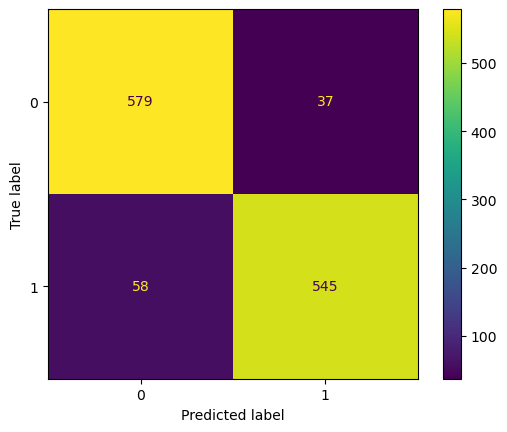

In [166]:
#  Confusion Matrix
cm1 = confusion_matrix(y_test, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm1,display_labels=lrc.classes_)
disp.plot()
plt.show()

In [37]:
pickle.dump(tfidf,open('vectorizer_fake.pkl','wb'))
pickle.dump(svc,open('model_fake.pkl','wb'))